# Spatially-informed Bivariate Metrics

This tutorial provides an overview of the local scores implemented in LIANA+. These scores are used to identify spatially co-expressed ligand-receptor pairs. However, there also applicable to other types of spatially-informed bivariate analyses.

It provides brief explanations of the mathematical formulations of the scores; these include adaptation of bivariate Moran's R, Pearson correlation, Spearman correlation, weighted Jaccard similarity, and Cosine similarity. The tutorial also showcases interaction categories (masks) and significance testing. 

## Environement Setup

In [1]:
import pandas as pd
import scanpy as sc
import plotnine as p9
import decoupler as dc
import liana as li

from mudata import MuData

## Load and Normalize Data

To showcase LIANA's local functions, we will use an ischemic 10X Visium spatial slide from [Kuppe et al., 2022](https://www.nature.com/articles/s41586-022-05060-x). It is a tissue sample obtained from a patient with myocardial infarction, focusing on the ischemic zone of the heart tissue. 

The slide provides spatially-resolved information about the cellular composition and gene expression patterns within the tissue.

In [2]:
adata = sc.read("kuppe_heart19.h5ad", backup_url='https://figshare.com/ndownloader/files/41501073?private_link=4744950f8768d5c8f68c')
adata.layers['counts'] = adata.X.copy()
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)

In [3]:
adata.obs.head()

,in_tissue,array_row,array_col,sample,n_genes_by_counts,log1p_n_genes_by_counts,total_counts,log1p_total_counts,pct_counts_in_top_50_genes,pct_counts_in_top_100_genes,pct_counts_in_top_200_genes,pct_counts_in_top_500_genes,mt_frac,celltype_niche,molecular_niche
AAACAAGTATCTCCCA-1,1,50,102,Visium_19_CK297,3125,8.047510,7194.0,8.881142,24.770642,31.387267,39.797053,54.503753,0.085630,ctniche_1,molniche_9
AAACAATCTACTAGCA-1,1,3,43,Visium_19_CK297,3656,8.204398,10674.0,9.275660,35.956530,42.167885,49.456624,61.045531,0.033275,ctniche_5,molniche_3
AAACACCAATAACTGC-1,1,59,19,Visium_19_CK297,3013,8.011023,7339.0,8.901094,33.247036,39.910069,47.227143,59.326884,0.029139,ctniche_5,molniche_3
AAACAGAGCGACTCCT-1,1,14,94,Visium_19_CK297,4774,8.471149,14235.0,9.563529,22.739726,29.884089,37.850369,51.099403,0.149194,ctniche_7,molniche_2
AAACAGCTTTCAGAAG-1,1,43,9,Visium_19_CK297,2734,7.913887,6920.0,8.842316,35.664740,42.268786,50.000000,62.384393,0.025601,ctniche_5,molniche_3


Spot clusters

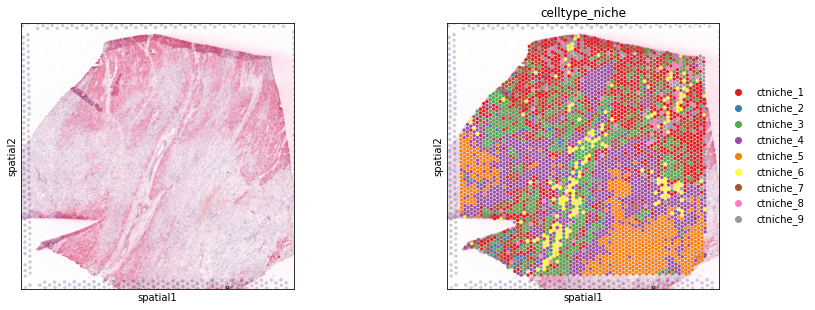

In [4]:
sc.pl.spatial(adata, color=[None, 'celltype_niche'], size=1.3, palette='Set1')

## Background

Here, we will demonstrate how to use the spatially-informed bivariate metrics to assess the spatial relationship between two variables. Specifically, we focus on local bivariate similarity metrics. In contrast to other spatial Methods, including [Misty](https://liana-py.readthedocs.io/en/latest/notebooks/misty.html); focusing on local spatial relationships enables us to pinpoint the exact location of spatial relationships, and to identify spatial relationships that might occur only in a specific sub-region of our samples.

Following the initial concept of LIANA, and inspired by [scHOT](https://www.nature.com/articles/s41592-020-0885-x), we have natively re-implemented **6** local bivariate metrics, including scHOT's (default) masked Spearman & [SpatialDM's](https://www.biorxiv.org/content/10.1101/2022.08.19.504616v1.full) local Moran's R.

As part of the [LIANA+ manuscript](https://www.biorxiv.org/content/10.1101/2023.08.19.553863v1.full), we performed two distinct tasks to evaluate the ability of these metrics to preserve biological information, and saw that on average when used to identify local ligand-receptor relationships, spatially-weighted Cosine similarity did best. Thus, we will focus on it throughout this tutorial. However, we expect that other scoring functions might be better suited for other tasks, e.g. Spatially-weighted Jaccard Similarity should be well suited for categorical data; thus we encourage you to explore them.

### Available Local Functions

In [5]:
li.mt.bivar.show_functions()

,name,metadata,reference
0,pearson,weighted Pearson correlation coefficient,None
1,spearman,weighted Spearman correlation coefficient,None
2,cosine,weighted Cosine similarity,None
3,jaccard,weighted Jaccard similarity,None
4,product,simple weighted product,None
5,norm_product,normalized weighted product,None
6,morans,Moran's R,"Li, Z., Wang, T., Liu, P. and Huang, Y., 2022...."
7,masked_spearman,masked & weighted Spearman correlation,"Ghazanfar, S., Lin, Y., Su, X., Lin, D.M., Pat..."


### How do they work?

The local functions work are quite simple, as they are simply weighted versions of well-known similarity metrics. For example, the spatially-weighted version of Cosine similarity is defined as:

$$cosw_i(x,y) = \frac{\sum_{i=1}^n w_{ij} x_{i} y_{i}}{\sqrt{\sum_{i=1}^n w_{ij} x_{i}^2} \sqrt{\sum_{i=1}^n w_{ij} y_{i}^2}}$$

where for each spot **i**, we perform summation over all spots **n**, where **w**​ represents the spatial connectivity weights from spot **i** to every other spot **j**;  for variables  **x** and **y**.

### Spatial Connectivity

The way that spatially-informed methods usually work is by making use of weights based on the proximity (or spatial connectivity) between spots/cells.
These spatial connectivities are then used to calculate the metric of interest, e.g. Cosine similarity, in a spatially-informed manner.

The spatial weights in LIANA+ are by default defined as a family of radial kernels that use the inverse Euclidean distance between cells/spots to bind the weights between 0 and 1, with spots that are closest having the highest spatial connectivity to one another (1), while those that are thought to be too far to be in contact are assigned 0.

Key parameters of spatial_neighbors include:
- `bandwidth` controls the radius of the spatial connectivities where higher values will result in a broader area being considered (controls the radius relative to the coordinates stored in `adata.obsm['spatial']`)
- `cutoff` controls the minimum value that will be considered to have a spatial relationship (anything lower than the `cutoff` is set to 0).
- `kernel` controls the distribution (shape) of the weights ('gaussian' by default)
- `set_diag` sets the diagonal (i.e. the weight for each spot to itself) to 1 if True. **NOTE**: Here we set it to True as we expect many cells to be neighbors of themselves within a visium spot

As choosing an optimal bandwidith can be tricky, we provide the ``query_bandwidth`` function which uses a set of coordinates to provide an estimate of how many cell or spot neighbors are being considered for each spot over a range of bandwidths. 

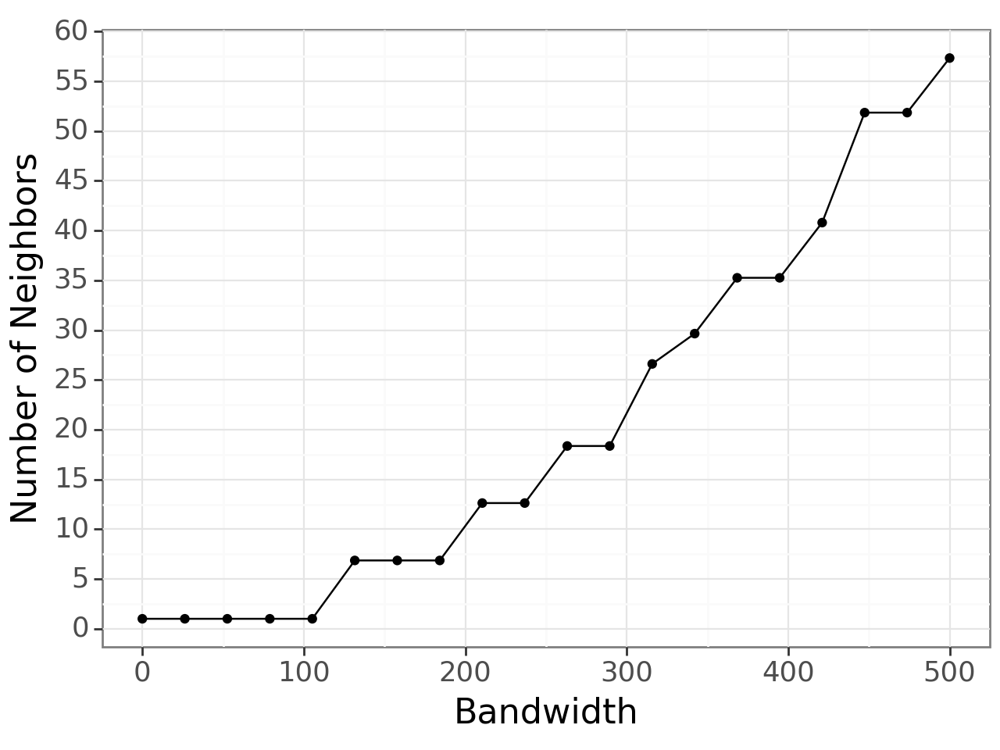

<Figure Size: (640 x 480)>

In [6]:
plot, _ = li.ut.query_bandwidth(coordinates=adata.obsm['spatial'], start=0, end=500, interval_n=20)
plot + p9.scale_y_continuous(breaks=range(0, 500, 5))

Here, we can see that a bandwidth of 150-200 (pixels) roughly includes 6 neighbours i.e. the first ring of neighbours in the hexagonal grid of 10x Visium. So, we will build the spatial graph with a bandwidth of 200.

In [7]:
li.ut.spatial_neighbors(adata, bandwidth=200, cutoff=0.1, kernel='gaussian', set_diag=True)

Let's visualize the spatial weights for a single spot to all other spots in the dataset:

Fontsize 0.00 < 1.0 pt not allowed by FreeType. Setting fontsize = 1 pt


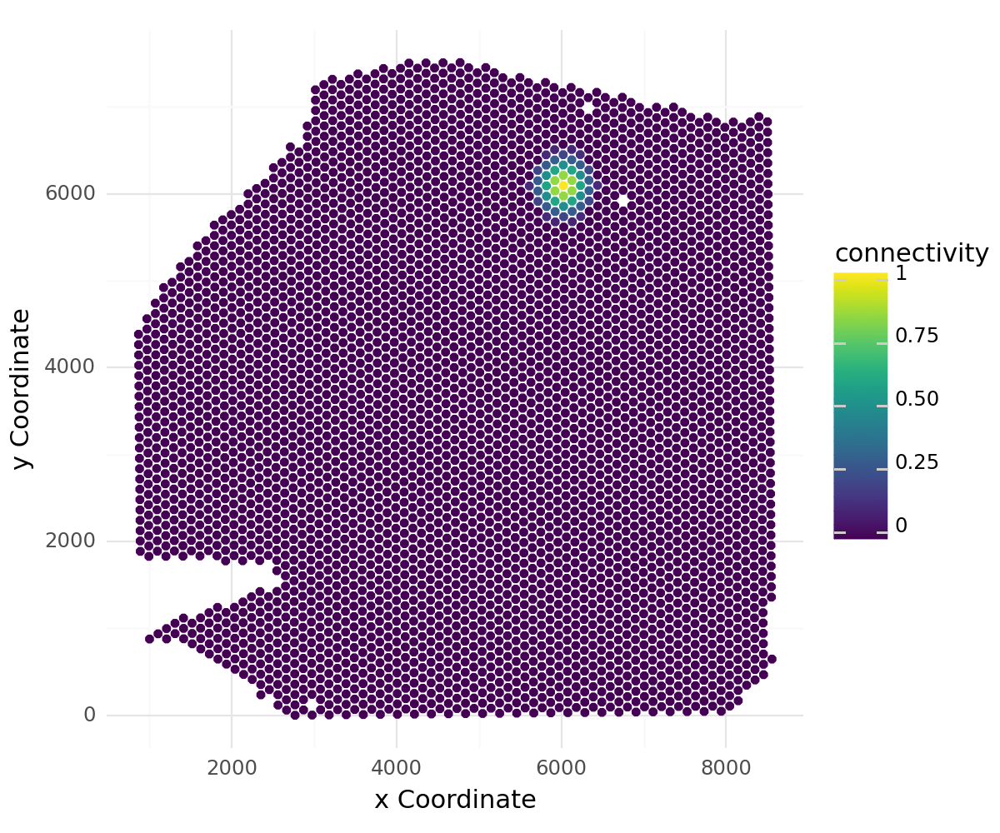

<Figure Size: (600 x 500)>

In [8]:
li.pl.connectivity(adata, idx=0, size=1.3, figure_size=(6, 5))

<div class="alert alert-success">

LIANA's connectivities are flexible and can be defined in any way that fits the user. We have thus aligned LIANA's `spatial_neighbors` function to [Squidpy](https://github.com/scverse/squidpy)'s `spatial_neighbors` function.
A perfectly viable solution would be to use Squidpy's nearest neighbors graph, which one can use to easily replace LIANA's radial connecitivies

</div>

## Local Ligand-Receptor Relationships

Now that we have covered the basics, let's see how these scores look for potential ligand-receptor interactions on our 10X Visium Slide.
Note that LIANA+ will take the presence of heteromeric complexes into account at the individual spot-level!

In [9]:
li.mt.lr_bivar(adata, 
               function_name='cosine', # Name of the function
               n_perms=100, # Number of permutations to calculate a p-value
               mask_negatives=False, # Whether to mask LowLow/NegativeNegative interactions
               add_categories=True, # Whether to add local categories to the results
               expr_prop=0.2, # Minimum expr. proportion for ligands/receptors and their subunits
               use_raw=False,
               verbose=True
               )

Using resource `consensus`.
Using `.X`!
100%|██████████| 100/100 [00:58<00:00,  1.72it/s]


Now that this is done, we can extract and explore the newly-created AnnData object that counts our local scores

In [10]:
lrdata = adata.obsm['local_scores']

In addition to the local scores, we can also extract the "global" scores for each pair of variables. For most local functions currently in LIANA+, These scores are calculated by averaging the local scores across all spots. We can use the "global" scores to choose the best pairs of variables to visualize:


In [11]:
lrdata.uns['global_res'].sort_values("global_mean", ascending=False).head(3)

,interaction,ligand,ligand_means,ligand_props,receptor,receptor_means,receptor_props,global_mean,global_sd
2752,TIMP1^CD63,TIMP1,3.048890,0.996839,CD63,2.887192,0.994165,0.981958,0.013757
266,LGALS1^ITGB1,LGALS1,3.534027,0.997326,ITGB1,2.457884,0.988330,0.978952,0.027114
274,LUM^ITGB1,LUM,3.173511,0.996353,ITGB1,2.457884,0.988330,0.963635,0.026913


In [12]:
lrdata.uns['global_res'].sort_values("global_sd", ascending=False).head(3)

,interaction,ligand,ligand_means,ligand_props,receptor,receptor_means,receptor_props,global_mean,global_sd
2875,S100A1^RYR2,S100A1,0.697087,0.572332,RYR2,0.430792,0.406516,0.489952,0.259712
1791,VTN^ITGAV_ITGB5,VTN,0.434514,0.395089,ITGAV_ITGB5,1.108789,0.814977,0.545211,0.234249
713,LPL^VLDLR,LPL,0.791770,0.609531,VLDLR,0.612294,0.540725,0.572515,0.231663


Visualize one of the top hits in terms of Global Mean Cosine Distance, and one of the hits with highest variance in terms of Global Mean Cosine Distance:

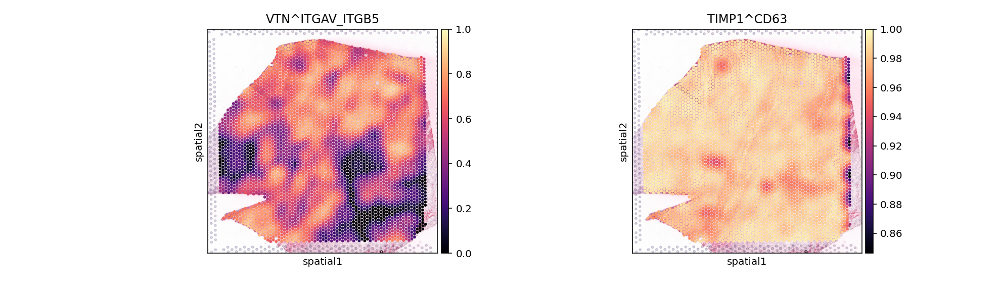

In [14]:
sc.pl.spatial(lrdata, color=['VTN^ITGAV_ITGB5', 'TIMP1^CD63'], size=1.4, vmax=1, cmap='magma')

As largely expected, we see that the average Cosine similarity largely represents **coverage**, as *TIMP1 & CD63* are roughly uniformly distributed across the slide. On the other hand, we look among the most variable pairs (e.g. VTN&ITGAV_ITGB5), we see that they are more likely to represent biological relationships, with distinct spatial clustering patterns.

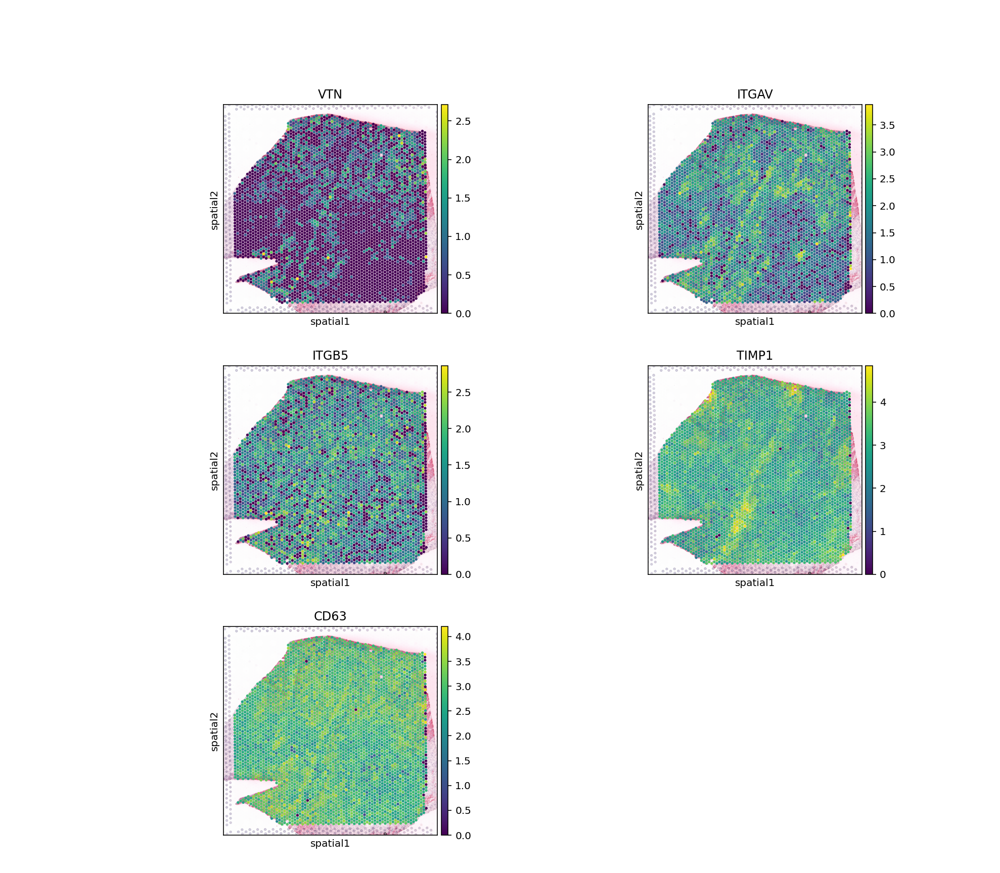

In [14]:
sc.pl.spatial(adata, color=['VTN', 'ITGAV', 'ITGB5', 
                            'TIMP1', 'CD63'],
              size=1.4, ncols=2)

Nevertheless, if we look closely at VTN we can see that it's likely the gene that mostly defines the potential interaction, as the integrin complex (ITGAV, ITGA5) is uniformly expressed.

This also highlight a limitation when using the average or standard deviation of Cosine similarity - i.e. that we don't necessarily focus on interactions between genes that cluster exclusively. To this end, one can use Global bivariate Moran's R - an extension of univariate Moran's I, as proposed by [Anselin 2019](https://onlinelibrary.wiley.com/doi/abs/10.1111/gean.12164?casa_token=Ac3Bb4VIkZUAAAAA:4w9OFifNe33riCnMpNbkghd4ULDokXJ9H9YCqdxebK8yH2ZibqTIAoPRRSzfY9UmCAQBqH6y8FBBsLwgOg); and implemented initially in [SpatialDM](https://github.com/StatBiomed/SpatialDM).

### Global Moran's R

As proposed in SpatialDM, we have re-implemented a bivariate extension of Moran's I = bivariate Moran's R. A useful property of Bivariate Moran's R is that it is bound between -1 (perfect negative spatial correlation) and 1 (perfect positive spatial correlation). Thus, it can be used to identify pairs of variables that are spatially clustered together, or apart.

In [15]:
global_morans, _ = li.mt.lr_bivar(adata, function_name="morans", inplace=False, use_raw=False)

In [16]:
global_morans.sort_values("global_r", ascending=False)

,interaction,ligand,ligand_means,ligand_props,receptor,receptor_means,receptor_props,global_r,global_pvals
70,APOE^LRP1,APOE,1.179983,0.752006,LRP1,1.937682,0.956236,0.284863,None
2881,S100A1^RYR2,S100A1,0.697087,0.572332,RYR2,0.430792,0.406516,0.271809,None
96,SERPING1^LRP1,SERPING1,1.711175,0.931437,LRP1,1.937682,0.956236,0.243951,None
1278,VTN^ITGAV_ITGB1,VTN,0.434514,0.395089,ITGAV_ITGB1,1.713479,0.929006,0.235151,None
75,MDK^LRP1,MDK,1.127114,0.789691,LRP1,1.937682,0.956236,0.227209,None
...,...,...,...,...,...,...,...,...,...
86,LPL^LRP1,LPL,0.791770,0.609531,LRP1,1.937682,0.956236,-0.244847,None
709,APOE^VLDLR,APOE,1.179983,0.752006,VLDLR,0.612294,0.540725,-0.264910,None
815,COL1A2^CD36,COL1A2,5.371640,1.000000,CD36,1.750551,0.923414,-0.308319,None
814,COL1A1^CD36,COL1A1,5.487195,1.000000,CD36,1.750551,0.923414,-0.313014,None


In this case, we see that the *VTN&ITGAV_ITGB1* is also among one of the interactions whose gene members are among the most spatially-clustered ones, but it also suggests that their co-occurrence is not exactly ideal (~0.25); i.e. while there is indeed a positive relationship between the two members of this interaction, but their co-expression is not necessarily perfect. This might be due to the fact that the integrin complex is also expressed in other cell types, or possibly the slightly noisy reads.

<div class="alert alert-info">
  While Moran's R provides a sound summary of spatial clustering, it is limited to two variables at a time and is thus not fit for complex, or non-linear, spatial relationships between variables. Thus, we also encourage the user to explore <a href="https://liana-py.readthedocs.io/en/latest/notebooks/misty.html">LIANA+'s re-implementation of MISTy</a>.
</div>




### Permutation-based p-values
In addition to the local scores, we also calculated permutation-based p-values based on a null distribution generated by shuffling the spot labels. Let's see how these look for the two interactions from above: 

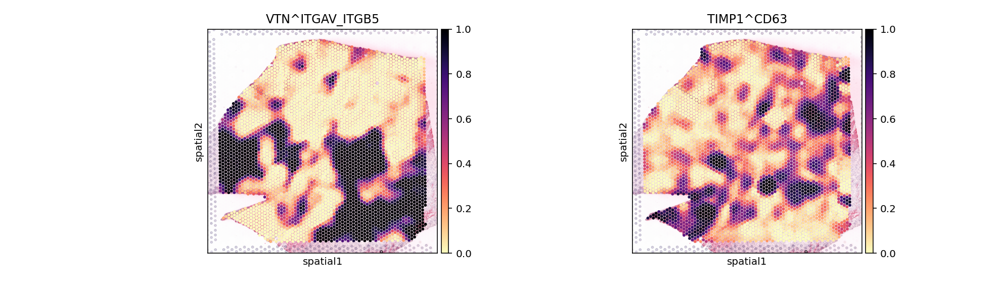

In [17]:
sc.pl.spatial(lrdata, layer='pvals', color=['VTN^ITGAV_ITGB5', 'TIMP1^CD63'], size=1.4, cmap="magma_r")

These largely agree with what we saw above for *VTN&ITGAV_ITGB1* as appears to be specific to a certain region.

### Local Categories

Did you notice that we used `mask_negatives` as a parameter when first estimating the interaction? This essentially means that we mask interactions in which both members are negative (or lowly expressed) when calculating the p-values, i.e. such which occur at places in which both members of the interaction are highly expressed. The locations at which both members are highly- expressed is defined as follows:

For each interaction, we define the category of both **x** and **y** for each spot as follows:

$$ Category_{i}(x) =
\begin{cases} 
\text{positive}, & \text{if } \sum_{i,j} (x_{i} \cdot w_{ij}) > 0 \\
\text{negative}, & \text{if } \sum_{i,j} (x_{i} \cdot w_{ij}) < 0 \\
\text{neither}, & \text{otherwise} 
\end{cases}

$$

Then we combine the categories of **x** and **y** for each spot, such that high-high are positive (1), high-low (or low-high) are -1; and low-low are 0.
When working with non-negative values (i.e. gene expression); the features will be z-scaled (across observations).

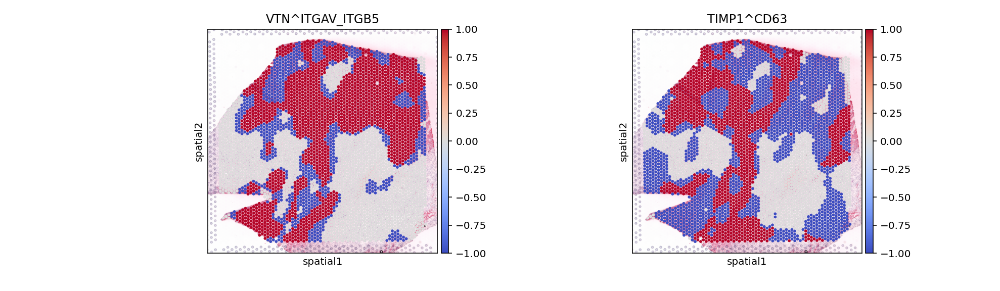

In [18]:
sc.pl.spatial(lrdata, layer='cats', color=['VTN^ITGAV_ITGB5', 'TIMP1^CD63'], size=1.4, cmap="coolwarm")

Here, we can distinguish areas in which the interaction between interaction members is positive (high-high) in Red (1), while interactions in which one is high the other is low or negative (High-low) are in Blue (-1). We also see that some interactions are neither, these are predominantly interactions in which both members are lowly-expressed (i.e. low-low); we see those in white (0).

When set to `mask_negatives=False`, we also return interactions that are not between necessarily positive/high magnitude genes ; when set to `mask_negatives=True`, we mask interactions that are negative (low-low) or uncategorized; for both the p-values and the local scores.

## Identify Intercellular Patterns

Now that we have estimated ligand-receptor scores, we can use non-negative matrix factorization (NMF) to identify coordinated cell-cell communication signatures.
This would ultimately decompose the ligand-receptor scores into a basis matrix (`W`) and a coefficient matrix (`H`). We will use a very simple utility function (around sklearn's NMF implementation) to do so, along with a simple `k` (component number) selection procedure.

* Basis Matrix (`W`):
        Each basis vector represents a characteristic pattern of ligand-receptor expression in the dataset.
        The values in `W` (factor score) indicate the strengths of factor in each spot; high values indicate high influence by the associated communication signature, while low values mean a weak influence.
* Coefficient Matrix (`H`):
        Each row of `H` represents the participation of the corresponding sample in the identified factor.
        The elements of each basis vector indicate the contribution of different interactions to the pattern (factor).

<img src="nmf.png" width=700 />


By decomposing the ligand-receptor interactions into W and H, NMF can potentially identify underlying CCC processes, with additive and non-negative relationships between the features. This property aligns well with the biological intuition that genes work together in a coordinated manner, but assumes linearity and only captures additive effects. Thus, alternative decomposition or clustering approaches can be used to a similar end. 

In this particular scenario, we chose NMF as it is a well-established method for decomposition of non-negative matrices, it is fast, and it is easy to interpret. Also, in our case the ligand-receptor local scores already encode the spatial relationships between the features, so we don't necessarily need to use a spatial-aware decomposition methods (e.g. [SpatialDE](https://www.nature.com/articles/nmeth.4636), [Spatial NMF](https://www.nature.com/articles/s41592-022-01687-w), [Chrysalis](https://github.com/rockdeme/chrysalis), or [MEFISTO](https://www.nature.com/articles/s41592-021-01343-9)).

One limitation of NMF is that it requires the number of components (factors) to be specified - a somewhat an arbitrary choice. To aid the selection of `n_components`, we provide a simple function that estimates an elbow based on reconstruction error.  Another limitation is that it only accepts non-negative values, so it won't work with metrics that can be negative (e.g. Pearson correlation). In this case, we use Cosine similarity with non-negative values, which results also in non-negative local scores.

In [19]:
li.multi.nmf(lrdata, n_components=None, inplace=True, random_state=0, max_iter=200, verbose=True)

100%|██████████| 9/9 [00:12<00:00,  1.36s/it]
Estimated rank: 3
/home/dbdimitrov/anaconda3/envs/test-env/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:1710: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.


In [20]:
# Extract the variable loadings
lr_loadings = li.ut.get_variable_loadings(lrdata, varm_key='NMF_H').set_index('index')

In [21]:
# Extract the factor scores
factor_scores = li.ut.get_factor_scores(lrdata, obsm_key='NMF_W')

Convert NMF Factor scores to an AnnData object for plotting

In [22]:
nmf = sc.AnnData(X=lrdata.obsm['NMF_W'],
                 obs=lrdata.obs,
                 var=pd.DataFrame(index=lr_loadings.columns),
                 uns=lrdata.uns,
                 obsm=lrdata.obsm)

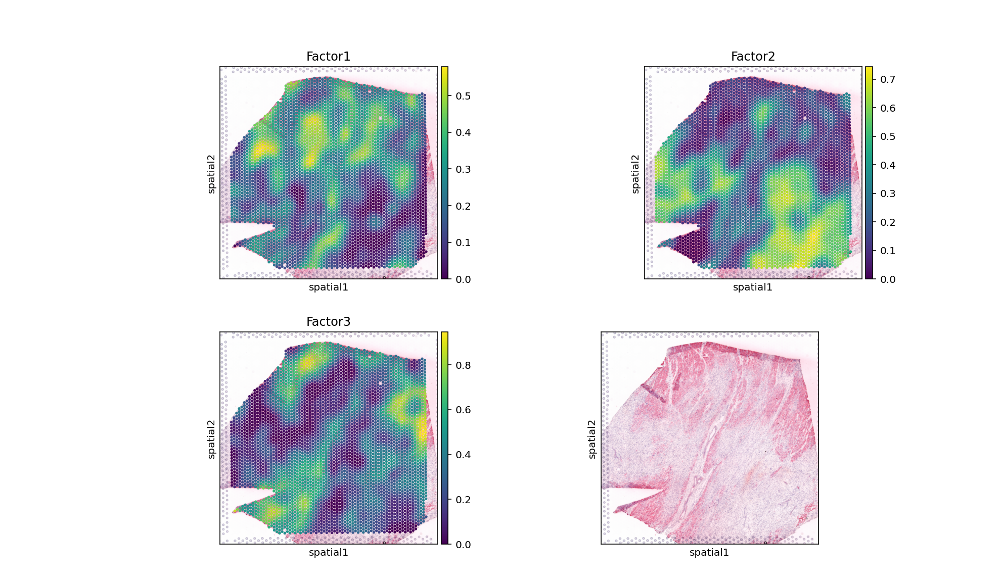

In [23]:
sc.pl.spatial(nmf, color=[*nmf.var.index, None], size=1.4, ncols=2)

Wee see that Factor 2 is largely covering the ischemic areas of the side, let's check the interactions contributing the most to it:

In [24]:
lr_loadings.sort_values("Factor2", ascending=False).head(10)

,Factor1,Factor2,Factor3
index,,,
APOE^LRP1,1.282725,1.268460,0.316382
MDK^LRP1,1.406665,1.198986,0.374126
C3^LRP1,0.845063,1.189272,0.179324
SERPING1^LRP1,1.517227,1.173517,0.553732
C3^CD81,0.729575,1.154561,0.231511
VCAN^ITGB1,1.512901,1.151918,0.657227
C1QB^LRP1,1.489980,1.151323,0.560984
PSAP^LRP1,1.556794,1.143980,0.681614
S100A9^CD68,1.276911,1.137524,0.377850


<div class="alert alert-info">
  From here on, one can estimate pathway activities or look for downstream effects of these interactions, plot the interactions, etc. These utility functions in liana are covered in other tutorials, but also applicable here.
</div>

## Beyond Ligand-Receptors

While protein-mediated ligand-receptor interactions are interesting, cell-cell communication is not limited to those alone. Rather it is a complex process that involves a variety of different mechanisms such as signalling pathways, metabolite-mediated signalling, and distinct cell types.

So, if such diverse mechanisms are involved in cell-cell communication, why should we limit ourselves to ligand-receptor interactions?
Let's see how we can use LIANA+ to explore other types of cell-cell communication.

One simple approach would be to check relationships e.g. between transcription factors and cell type proportions.

### Extract Cell type Composition
This slide comes with estimated cell type proportions using cell2location; See [Kuppe et al., 2022](https://www.nature.com/articles/s41586-022-05060-x). Let's extract from .obsm them to an independent AnnData object.

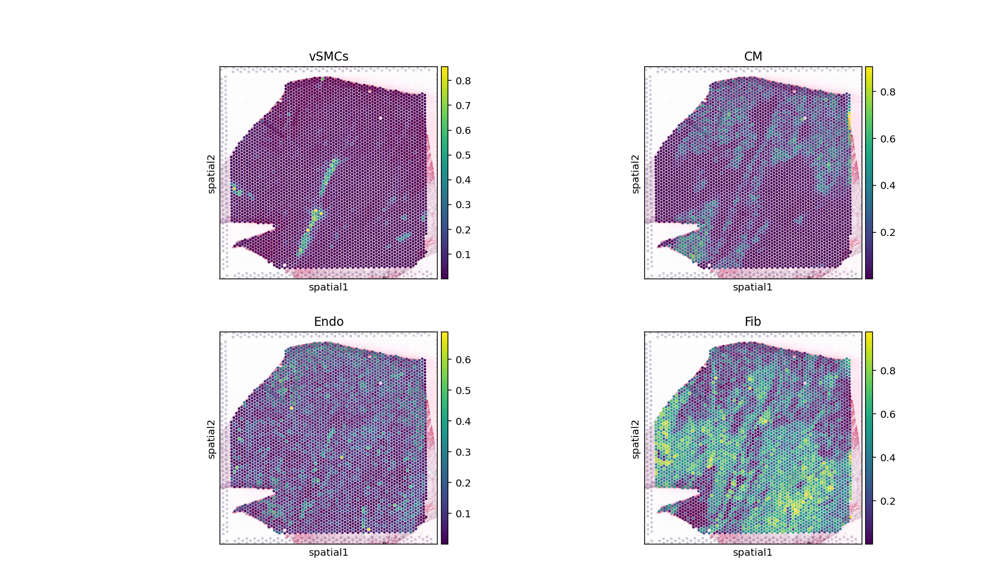

In [25]:
# let's extract those
comps = li.ut.obsm_to_adata(adata, 'compositions')
# check key cell types
sc.pl.spatial(comps, color=['vSMCs','CM', 'Endo', 'Fib'], size=1.3, ncols=2)

### Estimate Transcription Factor Activity

In [26]:
# Get transcription factor resource
net = dc.get_collectri()

While multi-omics datasets might be even more of an interest, for the sake of simplicity (and because the general lack of spatial mutli-omics data at current times), let's instead use enrichment analysis to estimate the activity of transcription factors in each spot. We will use one of [decoupler-py's](https://decoupler-py.readthedocs.io/en/latest/index.html) enrichment methods with [CollectTRI](https://www.biorxiv.org/content/10.1101/2023.03.30.534849v1.abstract) to do so. Refer to this [tutorial](https://decoupler-py.readthedocs.io/en/latest/notebooks/dorothea.html) for more info.

In [27]:
# run enrichment
dc.run_ulm(adata, net=net, use_raw=False, verbose=True)

Running ulm on mat with 4113 samples and 17703 targets for 694 sources.


100%|██████████| 1/1 [00:01<00:00,  1.44s/it]


#### Extract highly-variable TF activities
To reduce the number of TFs for the sake of computational speed, we will only focus on the top 50 most variable TFs.

Note we will use the simple coefficient of variation to identify the most variable TFs, but one can also use more sophisticated or spatially-informed methods to extract those (light-weight suggestions are welcome).


In [28]:
est = li.ut.obsm_to_adata(adata, 'ulm_estimate')
est.var['cv'] =  est.X.std(axis=0) / est.X.mean(axis=0)
top_tfs = est.var.sort_values('cv', ascending=False, key=abs).head(50).index


Create MuData object with TF activities and cell type proportions, and transfer spatial connectivities and other information from the original AnnData object.

In [29]:
mdata = MuData({"tf":est, "comps":comps})
mdata.obsp = adata.obsp
mdata.uns = adata.uns
mdata.obsm = adata.obsm

Define Interactions of interest:

In [30]:
from itertools import product

In [31]:
interactions = list(product(comps.var.index, top_tfs))

### Estimate Cosine Similarity

In [32]:
li.mt.bivar(mdata,
            x_mod="comps",
            y_mod="tf",
            x_transform=sc.pp.scale,
            y_transform=sc.pp.scale,
            function_name="cosine", 
            interactions=interactions,
            mask_negatives=True, 
            add_categories=True,
            x_use_raw=False,
            y_use_raw=False,
            xy_sep="<->",
            )

<div class="alert alert-info">

To make the distributions comparable, we simply z-scale the TF activities and cell type proportions via the `x_transform` & `y_transform` parameters.

The type of transformation will affect the interpretation of the results, and different types of transformation might be more appropriate for different types of data. We provide zero-inflated minmax `zi_minmax` & `neg_to_zero` transformation functions via `li.fun.transform`.

One can explore how different transformations affect the results, to also get a better feeling how these local metrics work.

</div>

In [33]:
mdata.mod['local_scores'].uns["global_res"].sort_values("global_mean", ascending=False).head(5)

,interaction,x,x_means,x_props,y,y_means,y_props,global_mean,global_sd
166,CM<->TBX20,CM,-4.452886e-09,1.0,TBX20,-2.968591e-09,1.0,0.619449,0.161595
366,Fib<->SNAI2,Fib,-1.804437e-09,1.0,SNAI2,-1.382432e-09,1.0,0.563575,0.194297
146,Fib<->SOX6,Fib,-1.804437e-09,1.0,SOX6,1.461012e-08,1.0,0.505218,0.246272
369,Myeloid<->SNAI2,Myeloid,-4.758476e-09,1.0,SNAI2,-1.382432e-09,1.0,0.459984,0.220001
452,CM<->HAND1,CM,-4.452886e-09,1.0,HAND1,-1.059379e-08,1.0,0.456130,0.220627


#### Let's plot the results

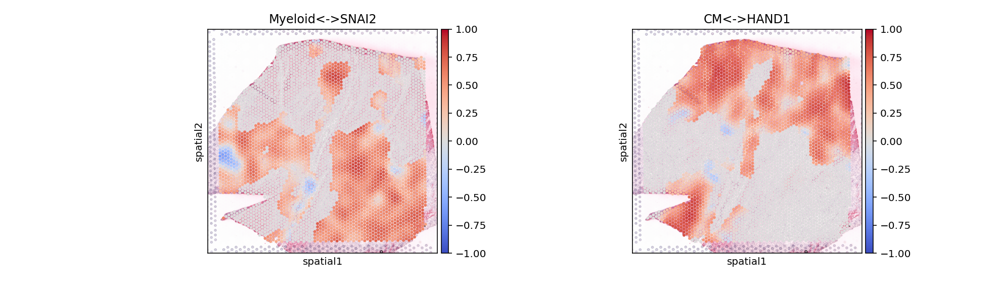

In [34]:
sc.pl.spatial(mdata.mod['local_scores'], color=['Myeloid<->SNAI2', 'CM<->HAND1'], size=1.4, cmap="coolwarm", vmax=1, vmin=-1)

Plot categories

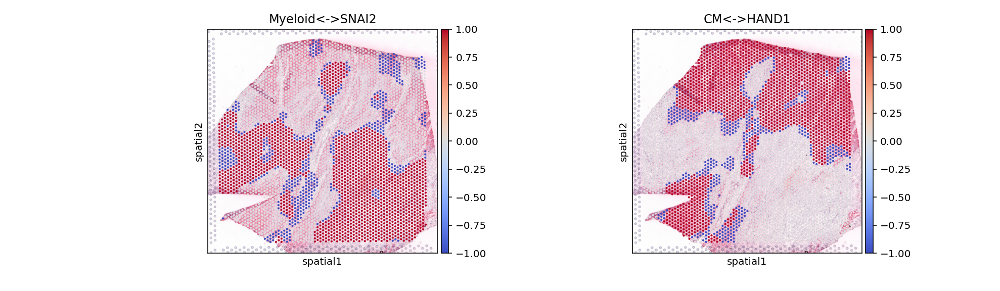

In [35]:
sc.pl.spatial(mdata.mod['local_scores'], layer='cats', color=['Myeloid<->SNAI2', 'CM<->HAND1'], cmap='coolwarm')

Plot variables (without transformations)

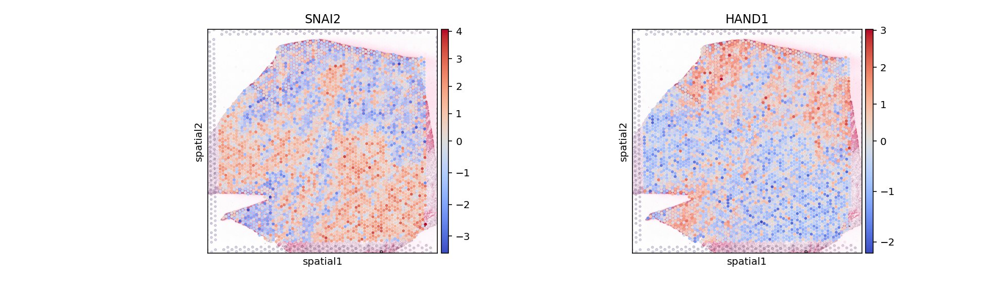

In [36]:
sc.pl.spatial(mdata.mod['tf'], color=['SNAI2', 'HAND1'], cmap='coolwarm', size=1.4, vcenter=0)

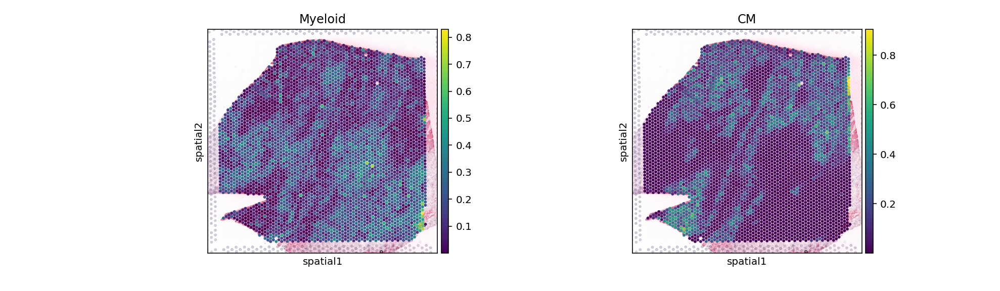

In [37]:
sc.pl.spatial(mdata.mod['comps'], color=['Myeloid', 'CM'], cmap='viridis', size=1.4)